# Setting up environment
1. Put the file paths in the next cell to its right place

``train_dir`` is the path to the train directory.

``val_dir`` is the path to the validation directory.

``out_dir`` is the path to the output directory. This directory will be where we save the model and the Tensorboard log.

2. Please run all. 

Notes: 
1. Please go to **Data Augmentation** section and follow the instruction if you want to run the model with data augmentation.
2. Please go to **Inference on Test dataset** section and follow the instruction if you want to just load an trained weights and do inference.
3. Please go to **Feature Map Extraction** section and follow the instruction if you want to extract feature maps of an image using your trained model.


In [1]:
train_dir = "datasets/train/"
val_dir = "datasets/val/"
out_dir = "trained_models/ResNet50_12epochs/"

## Install necessary libraries

In [2]:
!pip install tensorflow -U

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 578.0 MB 17 kB/s 
     |████████████████████████████████| 5.9 MB 77.9 MB/s 
     |████████████████████████████████| 1.7 MB 77.3 MB/s 
     |████████████████████████████████| 438 kB 93.2 MB/s 
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.9.0
    Uninstalling tensorflow-estimator-2.9.0:
      Successfully uninstalled tensorflow-estimator-2.9.0
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.9.1
    Uninstalling tensorboard-2.9.1:
      Successfully uninstalled tensorboard-2.9.1
  Attempting uninstall: keras
    Found existing installation: keras 2.9.0
    Uninstalling keras-2.9.0:
      Successfully uninstalled keras-2.9.0
  Attempting uninstall: flatbuffers
    Found existing installation: flatbuffers 1.12
    Uninstalling flatbuffers-1.12:
      Successfully u

## Import Libraries

In [3]:
import numpy as np
import os
import PIL
import PIL.Image
import tensorflow as tf
import cv2
import pandas as pd
import matplotlib.pyplot as plt
from tensorflow import keras
from tensorflow.keras import preprocessing
import shutil

In [4]:
%load_ext tensorboard

## Mount Google Drive

In [5]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [6]:
import os
#Change the current working directory to the path of Google Cloud Drive
path="/content/drive/My Drive/"
os.chdir(path)

# Data Augmentation

If you want to add more data into your training set by data augmentation, you may uncomment the next 2 cells. Please take note of the file paths when running the cells.

In [7]:
'''
Generate the augmented dataset and store it to /content/drive/MyDrive/datasets/augmented_images/
'''

# sdir='datasets'
# aug_dir=os.path.join(sdir,'augmented_images')
# os.mkdir(aug_dir) # make a new empty aug_dir
# filepaths=[]
# labels=[]
# # iterate through original_images and create a dataframe of the form filepaths, labels
# original_images_dir=os.path.join(sdir, 'train')
# for klass in ['cat', 'dog']:
#     os.mkdir(os.path.join(aug_dir,klass)) # make the class subdirectories in the aug_dir
#     classpath=os.path.join(original_images_dir, klass) # get the path to the classes (benign and maligant)
#     flist=os.listdir(classpath)# for each class the the list of files in the class    
#     for f in flist:        
#         fpath=os.path.join(classpath, f) # get the path to the file
#         filepaths.append(fpath)
#         labels.append(klass)
#     Fseries=pd.Series(filepaths, name='filepaths')
#     Lseries=pd.Series(labels, name='labels')
# df=pd.concat([Fseries, Lseries], axis=1) # create the dataframe
# gen=tf.keras.preprocessing.image.ImageDataGenerator(rotation_range=60, horizontal_flip=True, vertical_flip=False, brightness_range = (0.3, 1.6))
# groups=df.groupby('labels') # group by class
# for label in df['labels'].unique():  # for every class               
#     group=groups.get_group(label)  # a dataframe holding only rows with the specified label 
#     sample_count=len(group)   # determine how many samples there are in this class  
#     aug_img_count=0
#     target_dir=os.path.join(aug_dir, label)  # define where to write the images    
#     aug_gen=gen.flow_from_dataframe( group,  x_col='filepaths', y_col=None, target_size=(224,224), class_mode=None,
#                                         batch_size=1, shuffle=False, save_to_dir=target_dir, save_prefix='aug-',
#                                         save_format='jpg')
#     while aug_img_count<len(group):
#         images=next(aug_gen)            
#         aug_img_count += len(images)

'\nGenerate the augmented dataset and store it to /content/drive/MyDrive/datasets/augmented_images/\n'

In [8]:
'''
Merge the original and the augmented dataset into the folder /content/drive/MyDrive/datasets/augmented_images/
Please take note to change train_dir to /content/drive/MyDrive/datasets/augmented_images/ if you use 
'''


# import os
# import shutil

# source_folder = "/content/drive/MyDrive/datasets/train/dog/"
# destination_folder = "/content/drive/MyDrive/datasets/augmented_images/dog/"

# for file_name in os.listdir(source_folder):
#     # construct full file path
#     source = source_folder + file_name
#     destination = destination_folder + file_name
#     # copy only files
#     if os.path.isfile(source):
#         shutil.copy(source, destination)
#         print('copied', file_name)

# source_folder = "/content/drive/MyDrive/datasets/train/cat/"
# destination_folder = "/content/drive/MyDrive/datasets/augmented_images/cat/"

# for file_name in os.listdir(source_folder):
#     # construct full file path
#     source = source_folder + file_name
#     destination = destination_folder + file_name
#     # copy only files
#     if os.path.isfile(source):
#         shutil.copy(source, destination)
#         print('copied', file_name)

'\nMerge the original and the augmented dataset into the folder /content/drive/MyDrive/datasets/augmented_images/\nPlease take note to change train_dir to /content/drive/MyDrive/datasets/augmented_images/ if you use \n'

# Data Loading and Preprocessing

In [9]:
import pathlib

train_dir = pathlib.Path(train_dir)
val_dir = pathlib.Path(val_dir)

In [10]:
batch_size = 20
img_height = 224
img_width = 224

# Load training and validation set

train_ds = tf.keras.utils.image_dataset_from_directory(
  train_dir,
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

val_ds = tf.keras.utils.image_dataset_from_directory(
  val_dir,
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 20000 files belonging to 2 classes.
Found 5000 files belonging to 2 classes.


['cat', 'dog']


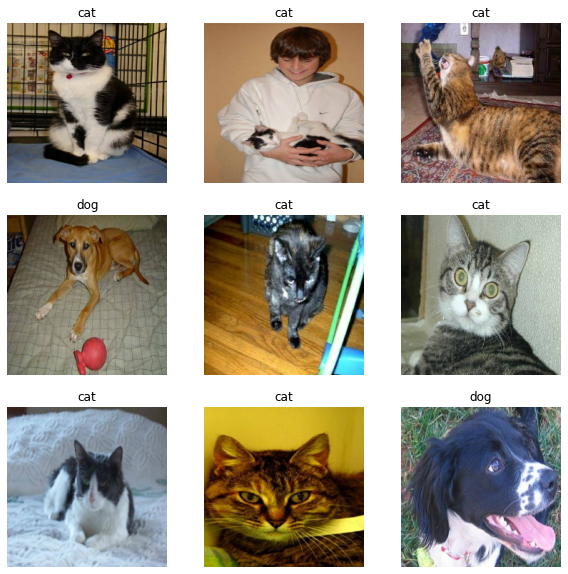

In [11]:
import matplotlib.pyplot as plt

# Visualize data from training/validation set

class_names = train_ds.class_names 
print(class_names)

plt.figure(figsize=(10, 10))
for images, labels in val_ds.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

In [12]:
for image_batch, labels_batch in train_ds:
  print(image_batch.shape)
  print(labels_batch.shape)
  break

(20, 224, 224, 3)
(20,)


In [13]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

# Model Construction

In [14]:
# Initialize ResNet50 layers with ImageNet weight (pre-trained)
# change the parameter 'weights' to None for training from scratch

num_classes = 2

cnn_layers = tf.keras.applications.resnet.ResNet50(
    include_top=False,
    input_shape = (224, 224, 3),
    weights='imagenet',
    pooling='avg',
    classes=num_classes,
)

94765736/94765736 [==============================] - 1s 0us/step


In [15]:
# add the fully-connected layers

rescale = tf.keras.layers.Rescaling(1./255)

dense_1 = tf.keras.layers.Dense(64, activation='relu')
dense_2 = tf.keras.layers.Dense(2, activation='softmax')

model = tf.keras.models.Sequential([rescale, cnn_layers, dense_1, dense_2])

model.build(input_shape = (None, 224, 224, 3))


In [16]:
# Optimizer and Loss function

lr_schedule = tf.keras.optimizers.schedules.PolynomialDecay(
    initial_learning_rate = 0.0002,
    decay_steps = 1000,
    end_learning_rate = 0.00002,
    power=1.0,
    cycle=False,
    name=None
)


optimizer = tf.keras.optimizers.Adam(learning_rate = lr_schedule)

model.compile(
  optimizer=optimizer,
  loss='sparse_categorical_crossentropy',
  metrics=['accuracy'])

In [17]:
# Model summary
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 224, 224, 3)       0         
                                                                 
 resnet50 (Functional)       (None, 2048)              23587712  
                                                                 
 dense (Dense)               (None, 64)                131136    
                                                                 
 dense_1 (Dense)             (None, 2)                 130       
                                                                 
Total params: 23,718,978
Trainable params: 23,665,858
Non-trainable params: 53,120
_________________________________________________________________


# Training The Model

In [18]:
# Setting up output directory

import datetime

dir = out_dir + datetime.datetime.now().strftime("%Y%m%d-%H%M")
os.makedirs(dir)
log_dir = os.path.join(dir, "tensorboard")

print(log_dir)

trained_models/ResNet50_12epochs/20221110-1825/tensorboard


In [19]:
'''
Checkpoint callbacks. Uncomment this to save checkpoint every epoch, and add checkpoint_callback to callbacks_list.
'''

# checkpoint_filepath = "/content/drive/MyDrive/trained_models/epoch_{epoch:02d}.ckpt"
# checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(checkpoint_filepath,
#                                                         save_weights_only=True,
#                                                         verbose=1)

tensorboard_callback = tf.keras.callbacks.TensorBoard(
                            log_dir=log_dir,
                            update_freq = 100)

callbacks_list = [tensorboard_callback]

## Checking your training
Please uncomment the following cell and include your path to the Tensorboard log to see the progress of your training

In [20]:
# %tensorboard --logdir /content/drive/MyDrive/trained_models/ResNet50_12epochs/20221107-1356/tensorboard

## Train the first 2 epochs
After this 2 epochs, a checkpoint will be saved

In [21]:
# Freeze the ResNet50 layers

for layer in cnn_layers.layers:
    layer.trainable = False

In [22]:
# Train the first 6 epochs
# only the Fully-Connected layers are trained
# the CNNs layer are freezed

epochs = 2

model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs,
  callbacks=callbacks_list
)

model.save(dir + "/model_cnn_freezed.h5")

Epoch 1/2
1000/1000 [==============================] - 572s 556ms/step - loss: 0.0839 - accuracy: 0.9689 - val_loss: 0.0539 - val_accuracy: 0.9762
Epoch 2/2
1000/1000 [==============================] - 60s 60ms/step - loss: 0.0074 - accuracy: 0.9979 - val_loss: 0.0313 - val_accuracy: 0.9882


## Train the last 2 epochs
After this 2 epochs, the final model will be saved

In [23]:
# Unfreeze the ResNet50 layers

for layer in cnn_layers.layers:
    layer.trainable = True

# Model summary
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 224, 224, 3)       0         
                                                                 
 resnet50 (Functional)       (None, 2048)              23587712  
                                                                 
 dense (Dense)               (None, 64)                131136    
                                                                 
 dense_1 (Dense)             (None, 2)                 130       
                                                                 
Total params: 23,718,978
Trainable params: 23,665,858
Non-trainable params: 53,120
_________________________________________________________________


In [24]:
# Train the next 2 epochs
# the whole network is trained

epochs = 4

model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs,
  initial_epoch = 2,
  callbacks=callbacks_list
)

model.save(dir + "/model_full.h5")

Epoch 3/4
1000/1000 [==============================] - 60s 60ms/step - loss: 0.0012 - accuracy: 0.9998 - val_loss: 0.0348 - val_accuracy: 0.9892
Epoch 4/4
1000/1000 [==============================] - 60s 60ms/step - loss: 4.8230e-04 - accuracy: 0.9998 - val_loss: 0.0397 - val_accuracy: 0.9892


# Inference on Test dataset
You may do an inference of the model you just trained and store the output in a CSV file. If you want to load a model from a file, please change the file path in the cell below. Remember to import the libraries again if you did not run the previous sections.

In [25]:
model_path = dir + "/model_full.h5"
csv_path = "/content/drive/MyDrive/submission.csv"

In [26]:
# import numpy as np
# import os
# import PIL
# import PIL.Image
# import tensorflow as tf
# import cv2
# import pandas as pd
# import matplotlib.pyplot as plt
# from tensorflow import keras
# from tensorflow.keras import preprocessing
# import shutil

In [27]:
model = tf.keras.models.load_model(model_path)

In [28]:
img_height = 224
img_width = 224

In [29]:
# Inference on Test set

from PIL import Image
import glob
image_list = []
for i in range(500):
    filename = '/content/drive/MyDrive/datasets/test/' + str(i+1) + '.jpg'
    im=Image.open(filename)
    image_array = np.array(im)
    image_array = tf.image.resize(
        image_array,
        (img_height, img_width),
    )
    image_list.append(image_array)


In [30]:
len(image_list)

500

In [31]:
predictions = model.predict(np.array(image_list))
predictions = np.argmax(predictions, axis=1) 


16/16 [==============================] - 1s 17ms/step


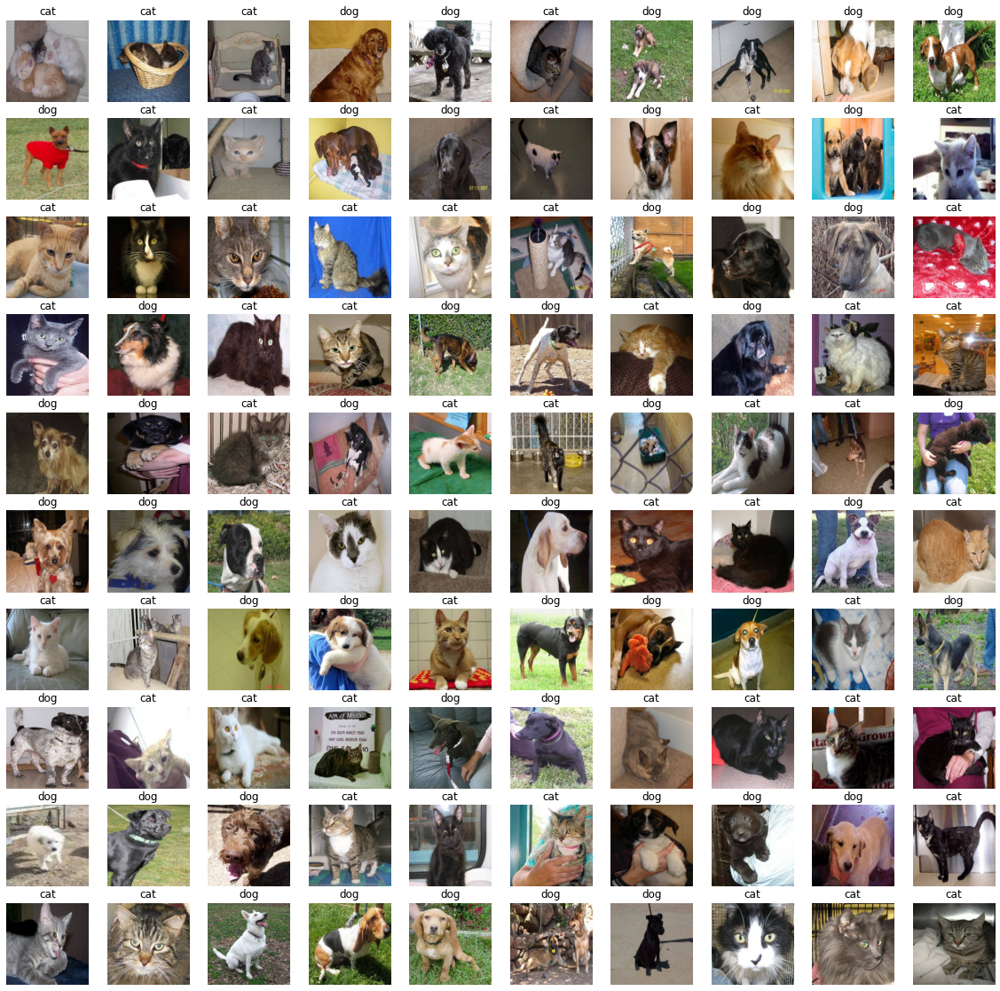

In [32]:
class_names = ['cat', 'dog']

from matplotlib import pyplot as plt

plt.figure(figsize=(20, 20))
for i in range(100):
  ax = plt.subplot(10, 10, i + 1)
  plt.imshow(image_list[i].numpy().astype("uint8"))
  label = predictions[i]
  plt.title(class_names[label])
  # if class_names[label] == "cat"
  # result_df = pd.DataFrame(1)
  # else if class_names[label] == "dog"
 
  plt.axis("off")

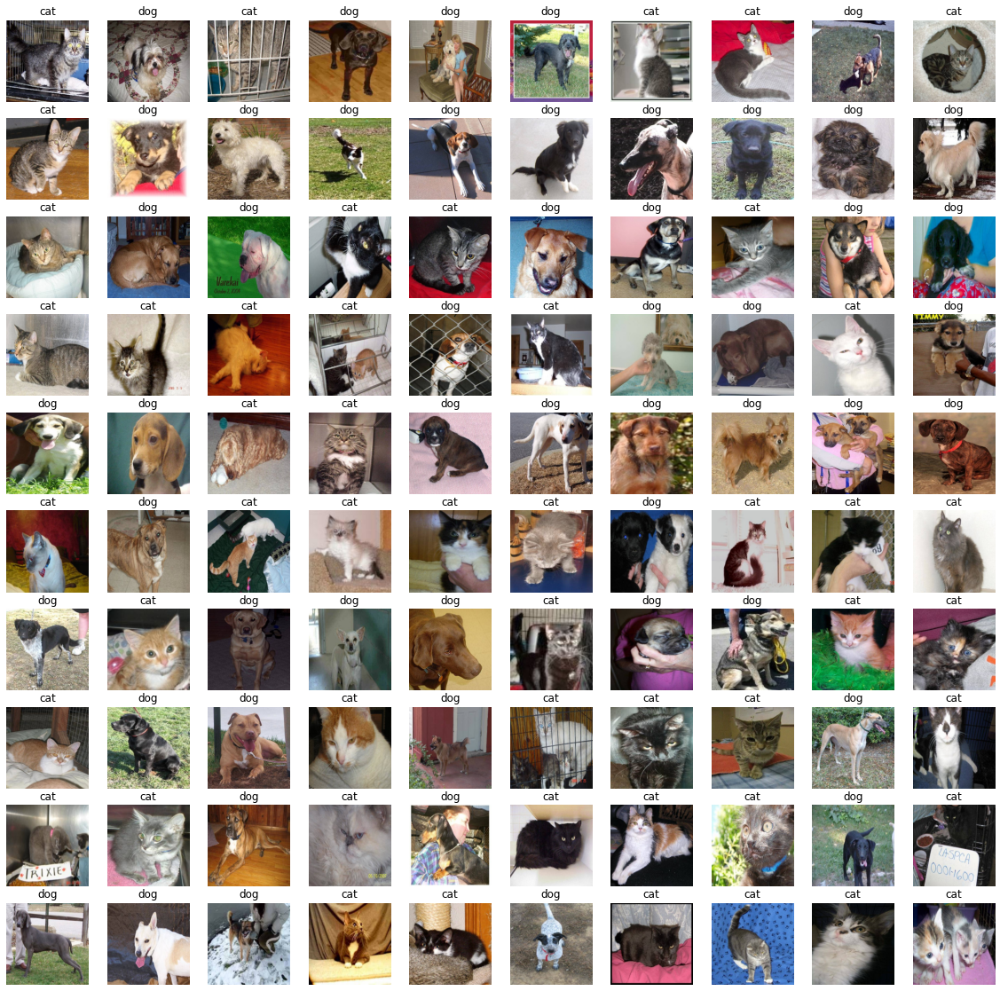

In [33]:
plt.figure(figsize=(20, 20))
for i in range(100, 200):
  ax = plt.subplot(10, 10, i + 1 - 100)
  plt.imshow(image_list[i].numpy().astype("uint8"))
  label = predictions[i]
  plt.title(class_names[label])
  plt.axis("off")

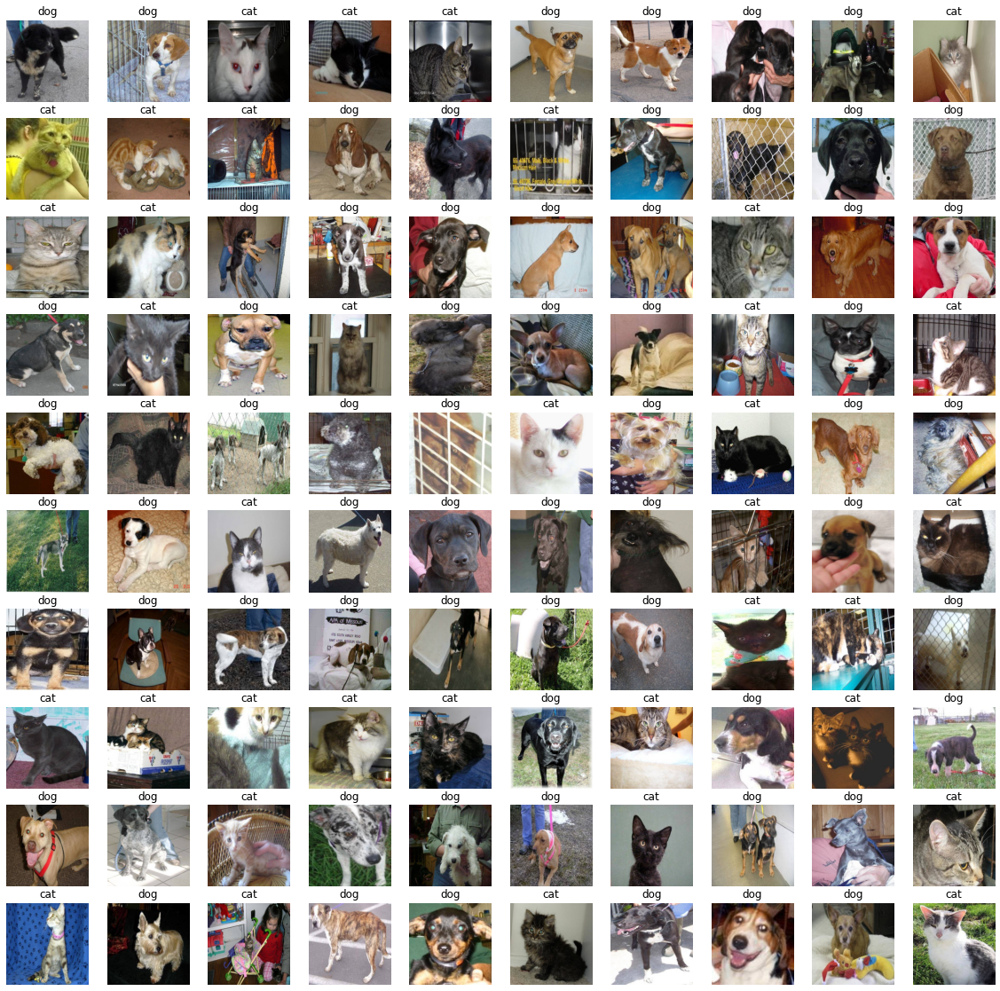

In [34]:
plt.figure(figsize=(20, 20))
for i in range(200, 300):
  ax = plt.subplot(10, 10, i + 1 - 200)
  plt.imshow(image_list[i].numpy().astype("uint8"))
  label = predictions[i]
  plt.title(class_names[label])
  plt.axis("off")

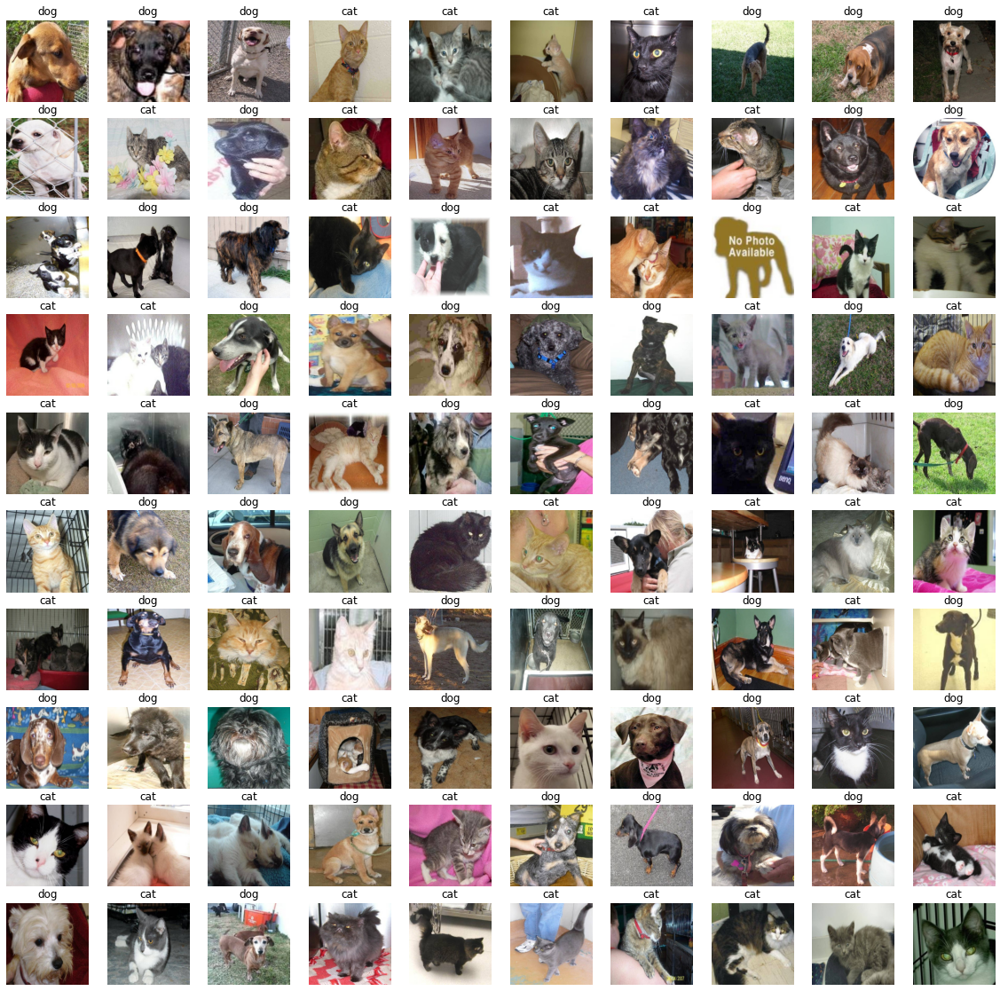

In [35]:
plt.figure(figsize=(20, 20))
for i in range(300, 400):
  ax = plt.subplot(10, 10, i + 1 - 300)
  plt.imshow(image_list[i].numpy().astype("uint8"))
  label = predictions[i]
  plt.title(class_names[label])
  plt.axis("off")

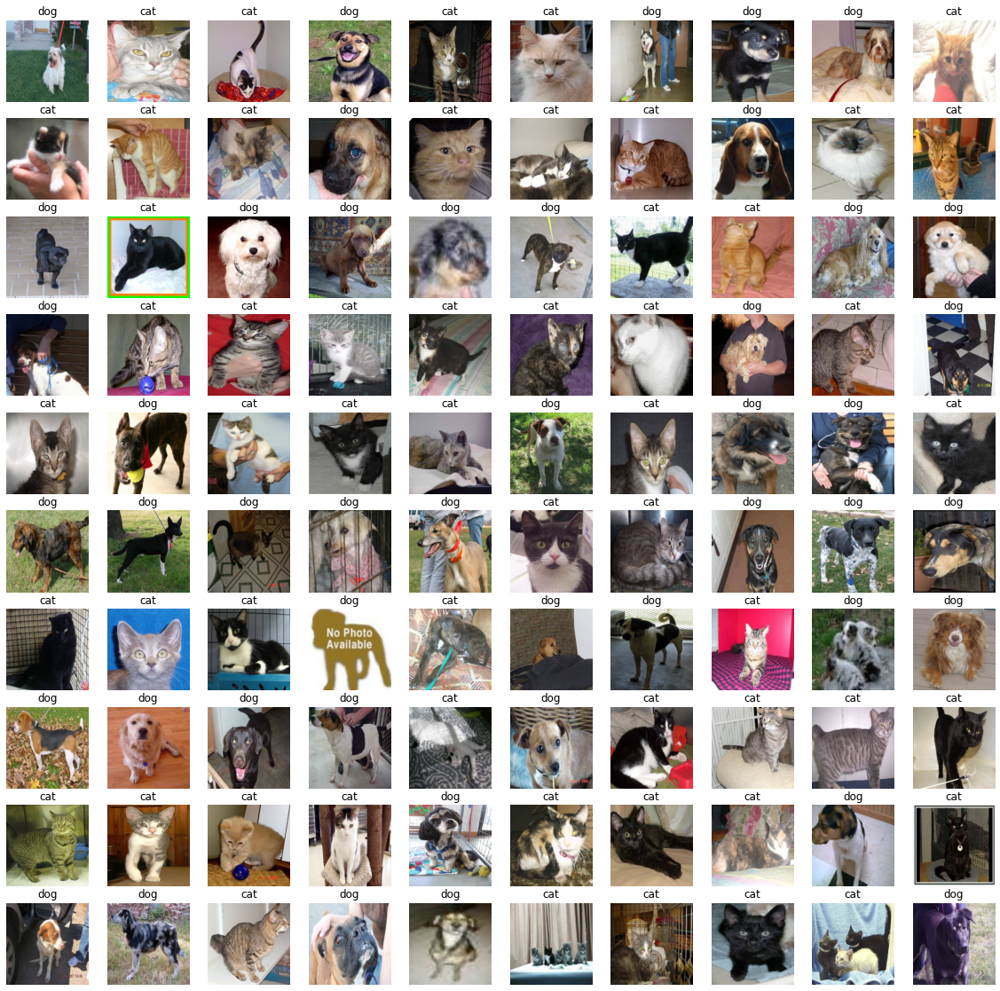

In [36]:
plt.figure(figsize=(20, 20))
for i in range(400, 500):
  ax = plt.subplot(10, 10, i + 1 - 400)
  plt.imshow(image_list[i].numpy().astype("uint8"))
  label = predictions[i]
  plt.title(class_names[label])
  plt.axis("off")

In [38]:
#export to csv

predictions = pd.Series(predictions,name="Label")
submit = pd.concat([pd.Series(range(1,20001),name = "ImageId"),predictions],axis = 1)
submit.to_csv(csv_path,index=False)

# Feature Map Extraction
If you want to extract feature map of an image passing through a model, please use this part. Remember that the model architecture should be the same as ours.
Please specify your model path and image to extract in the cell below.

In [39]:
model_path = dir + "/model_full.h5"
image_to_extract_pth = '/content/drive/MyDrive/datasets/test/342.jpg'

In [40]:
# import numpy as np
# import os
# import PIL
# import PIL.Image
# import tensorflow as tf
# import cv2
# import pandas as pd
# import matplotlib.pyplot as plt
# from tensorflow import keras
# from tensorflow.keras import preprocessing
# import shutil

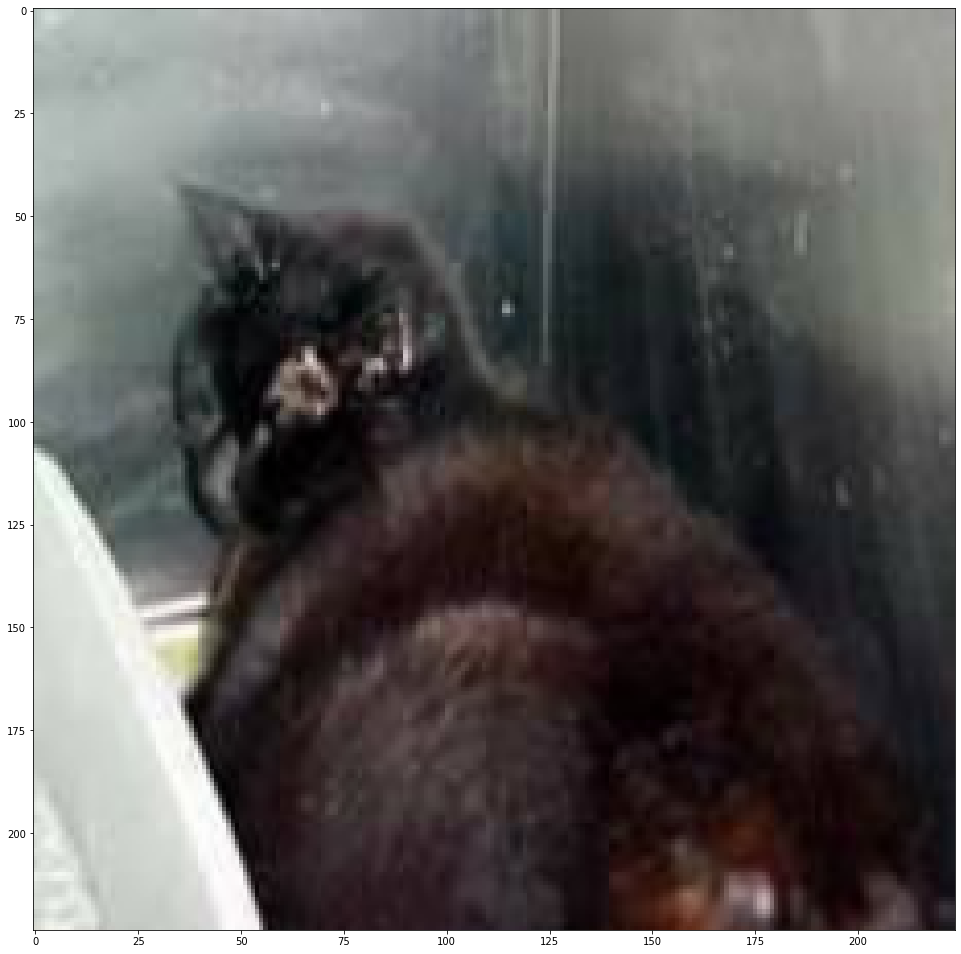

In [41]:
import cv2
image_to_extract = Image.open(image_to_extract_pth)
image_to_extract = np.array(image_to_extract)
image_to_extract = tf.image.resize(image_to_extract, (224, 224))
image_to_extract = np.array(image_to_extract)
plt.figure(figsize=(200, 200))
ax = plt.subplot(10, 10, 1)
plt.imshow(image_to_extract.astype("int"))
image_to_extract = np.expand_dims(image_to_extract, axis=0)

In [42]:
model(image_to_extract)

<tf.Tensor: shape=(1, 2), dtype=float32, numpy=array([[9.999981e-01, 1.925103e-06]], dtype=float32)>

In [43]:
feature_extractor = tf.keras.Sequential([model.layers[0]] + model.layers[1].layers[0:14])
feature_extractor.build(input_shape = (None, 224, 224, 3))

In [44]:
feature_extractor.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 224, 224, 3)       0         
                                                                 
 input_1 (InputLayer)        multiple                  0         
                                                                 
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)       0         
                                                                 
 conv1_conv (Conv2D)         (None, 112, 112, 64)      9472      
                                                                 
 conv1_bn (BatchNormalizatio  (None, 112, 112, 64)     256       
 n)                                                              
                                                                 
 conv1_relu (Activation)     (None, 112, 112, 64)      0         
                                                      

In [45]:
feature_map = feature_extractor(image_to_extract)

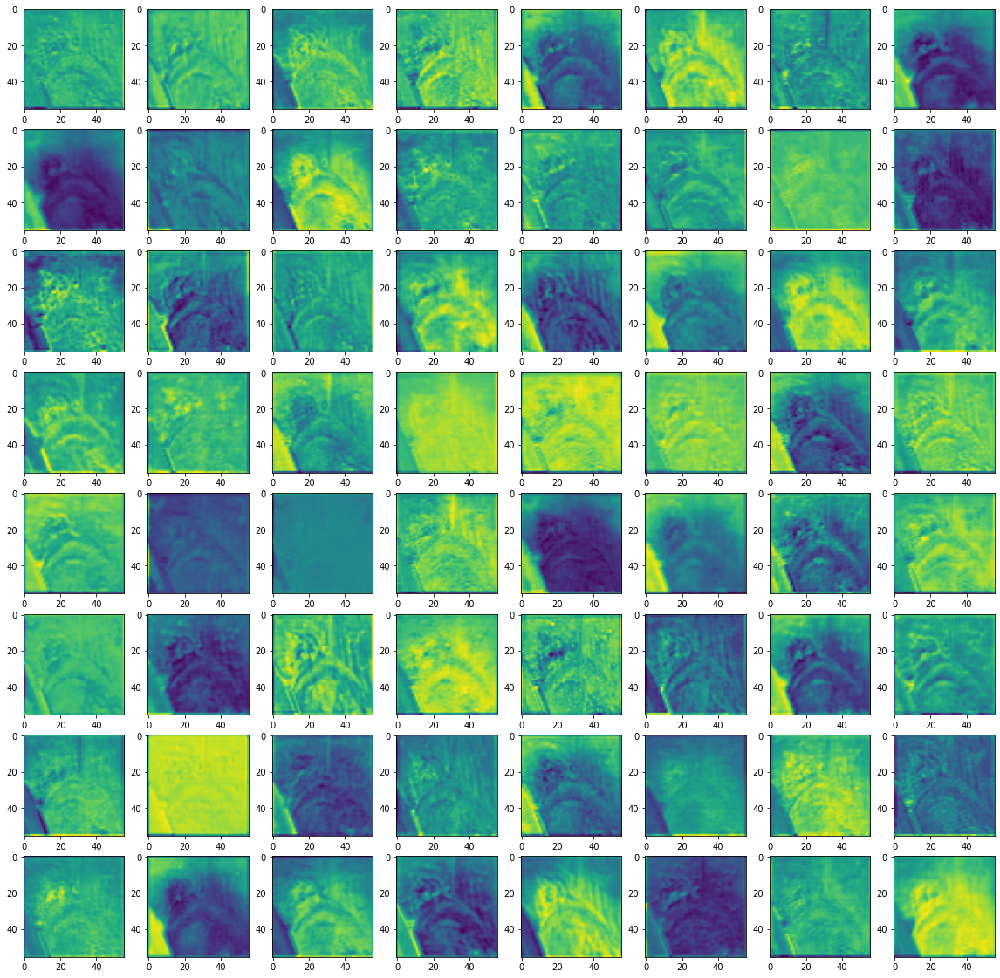

In [46]:
plt.figure(figsize=(20,20))
for i in range(64):
    plt.subplot(8,8,i+1)
    plt.imshow(feature_map[0,:,:,i])
plt.show()